In [21]:
import pandas as pd

df = pd.read_csv('../pulse_data/pulseeco_avg_day_2018-2025_final.csv')
df

,city,type,value,timestamp
0,skopje,pm10,212,2018-01-01T13:00:00+01:00
1,skopje,pm10,170,2018-01-02T13:00:00+01:00
2,skopje,pm10,37,2018-01-03T13:00:00+01:00
3,skopje,pm10,49,2018-01-04T13:00:00+01:00
4,skopje,pm10,107,2018-01-05T13:00:00+01:00
...,...,...,...,...
124433,kichevo,no2,7,2025-12-05T13:00:00+01:00
124434,kichevo,no2,10,2025-12-06T13:00:00+01:00
124435,kichevo,no2,6,2025-12-07T13:00:00+01:00
124436,kichevo,no2,8,2025-12-08T13:00:00+01:00


In [3]:
print(len(df))
print(df.columns)
print(df['city'].unique())
print(df['type'].unique())

124438
Index(['city', 'type', 'value', 'timestamp'], dtype='object')
['skopje' 'bitola' 'novoselo' 'tetovo' 'ohrid' 'kichevo' 'kumanovo'
 'shtip' 'strumica' 'gostivar' 'struga' 'resen' 'bogdanci' 'stardojran'
 'veles' 'kocani' 'krusevo' 'radovis']
['pm10' 'pm25' 'temperature' 'humidity' 'noise' 'o3' 'no2' 'co']


In [4]:
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True, errors='coerce')
df = df.sort_values('timestamp').reset_index(drop=True)

In [5]:
import numpy as np

df['dayofyear'] = df['timestamp'].dt.dayofyear
df['dayofweek'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year

df['sin_doy'] = np.sin(2 * np.pi * df['dayofyear'] / 365)
df['cos_doy'] = np.cos(2 * np.pi * df['dayofyear'] / 365)


In [6]:
LAGS = [1, 2, 3, 7, 14, 30]

for lag in LAGS:
    df[f'lag_{lag}'] = df.groupby(['city', 'type'])['value'].shift(lag)

In [7]:
WINDOWS = [7, 14, 30]

df = df.copy()
for w in WINDOWS:
    df.loc[:, f'roll_mean_{w}'] = (
        df.groupby(['city', 'type'])['value']
          .shift(1)
          .rolling(w)
          .mean()
    )
df = df.dropna().reset_index(drop=True)
df

,city,type,value,timestamp,dayofyear,dayofweek,month,year,sin_doy,cos_doy,lag_1,lag_2,lag_3,lag_7,lag_14,lag_30,roll_mean_7,roll_mean_14,roll_mean_30
0,skopje,pm25,62,2018-01-31 12:00:00+00:00,31,2,1,2018,0.508671,0.860961,94.0,123.0,126.0,30.0,27.0,147.0,89.285714,80.714286,66.533333
1,skopje,temperature,10,2018-01-31 12:00:00+00:00,31,2,1,2018,0.508671,0.860961,9.0,8.0,7.0,6.0,8.0,6.0,72.571429,78.071429,65.500000
2,skopje,pm10,84,2018-01-31 12:00:00+00:00,31,2,1,2018,0.508671,0.860961,128.0,170.0,193.0,49.0,40.0,212.0,84.428571,83.142857,69.566667
3,skopje,noise,55,2018-01-31 12:00:00+00:00,31,2,1,2018,0.508671,0.860961,60.0,59.0,54.0,57.0,58.0,51.0,75.428571,80.214286,69.666667
4,skopje,humidity,44,2018-01-31 12:00:00+00:00,31,2,1,2018,0.508671,0.860961,44.0,45.0,47.0,40.0,59.0,51.0,57.428571,82.857143,70.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120192,radovis,pm10,26,2025-12-26 12:00:00+00:00,360,4,12,2025,-0.085965,0.996298,34.0,57.0,117.0,95.0,61.0,26.0,24.000000,21.785714,25.900000
120193,kumanovo,noise,24,2025-12-26 12:00:00+00:00,360,4,12,2025,-0.085965,0.996298,25.0,23.0,22.0,23.0,24.0,13.0,26.428571,22.285714,26.033333
120194,resen,pm10,43,2025-12-26 12:00:00+00:00,360,4,12,2025,-0.085965,0.996298,36.0,59.0,66.0,90.0,77.0,32.0,26.428571,24.214286,27.100000
120195,krusevo,pm25,59,2025-12-26 12:00:00+00:00,360,4,12,2025,-0.085965,0.996298,60.0,42.0,70.0,18.0,6.0,20.0,33.857143,28.071429,28.800000


In [8]:
from sklearn.preprocessing import OneHotEncoder

cat_features = ['city', 'type']
num_features = [
    'dayofweek', 'month', 'year', 'sin_doy', 'cos_doy'
] + [f'lag_{l}' for l in LAGS] + [f'roll_mean_{w}' for w in WINDOWS]

In [9]:
import os

model_dir = "../models/pulse_city_indicator_models"
os.makedirs(model_dir, exist_ok=True)

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

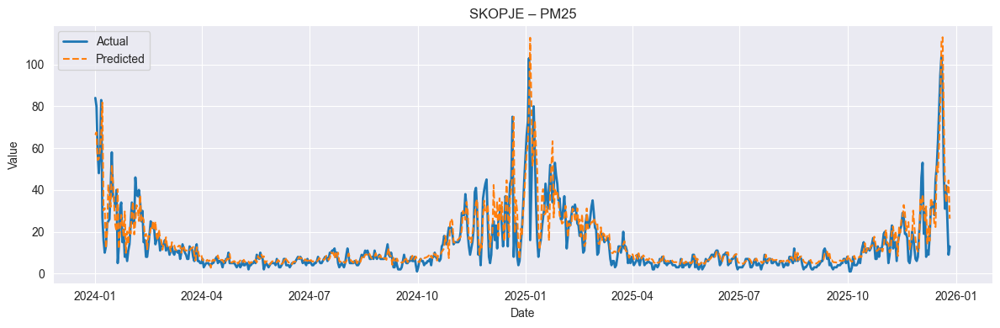

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

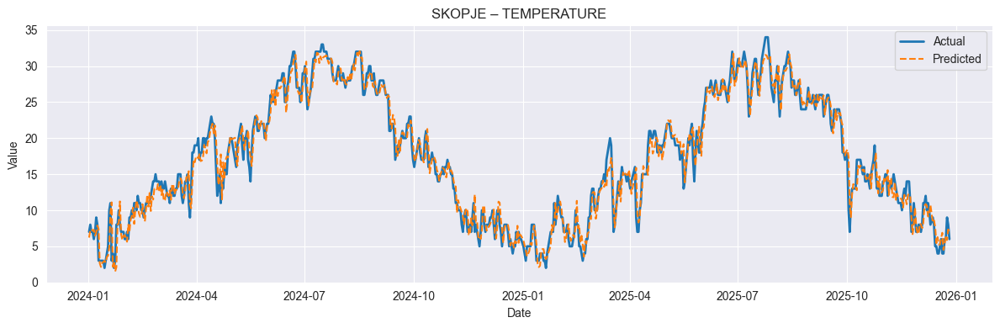

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

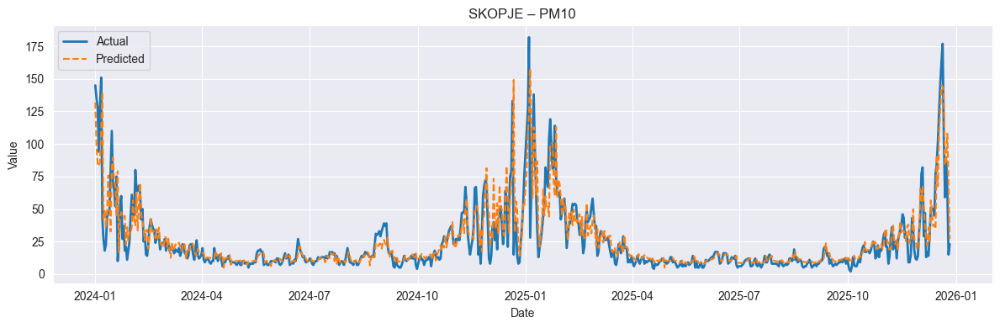

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

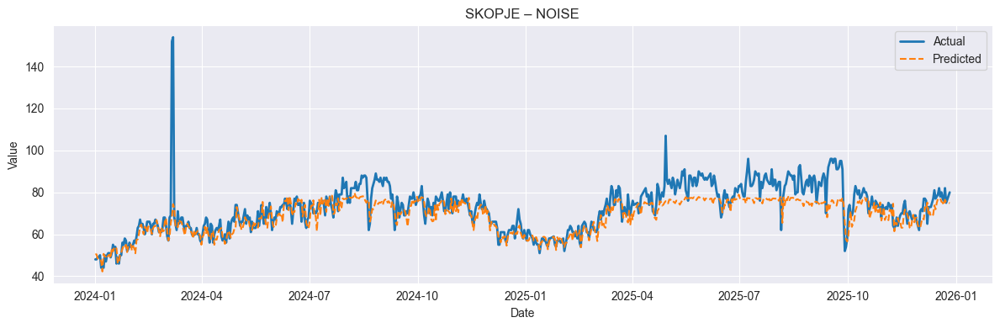

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

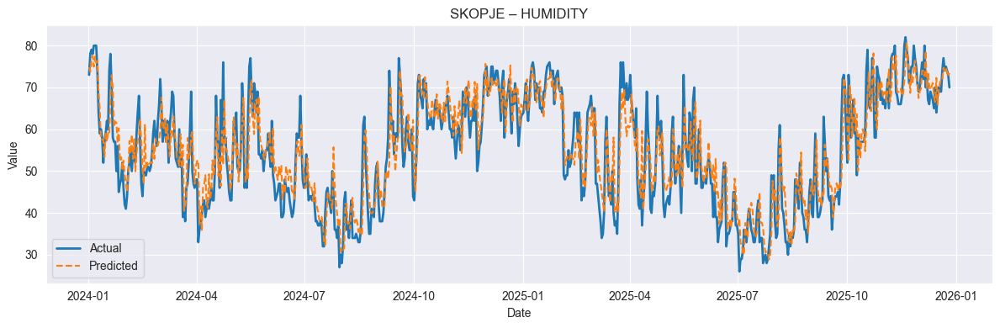

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

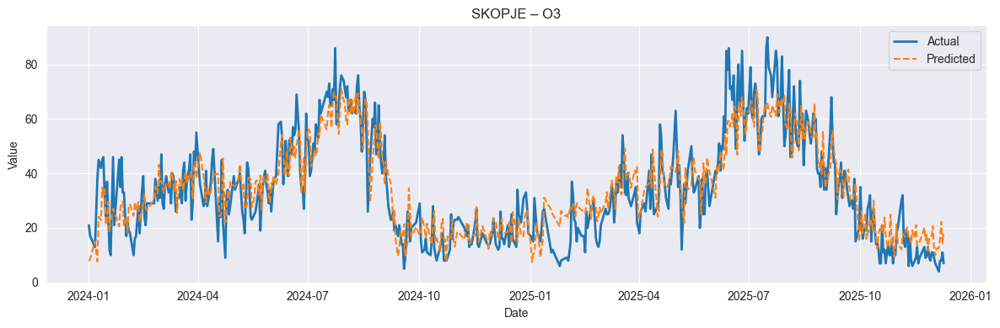

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

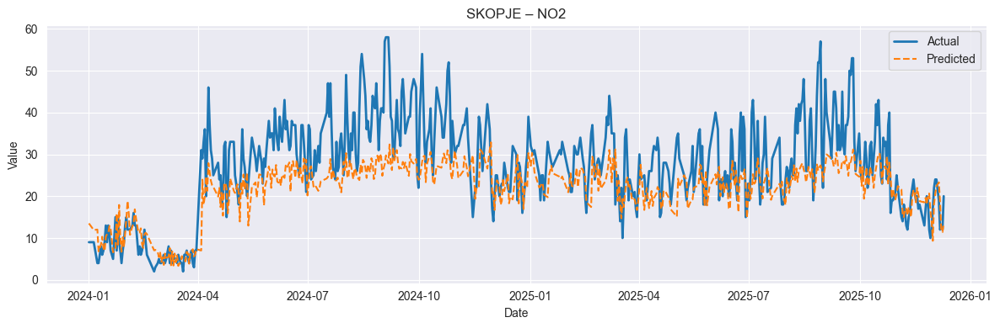

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

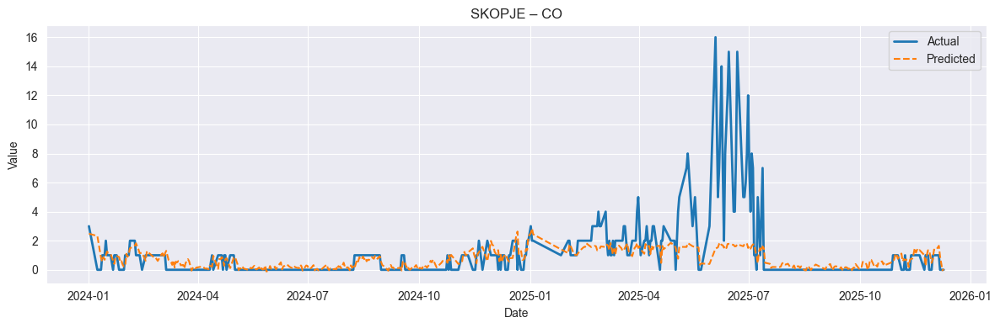

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

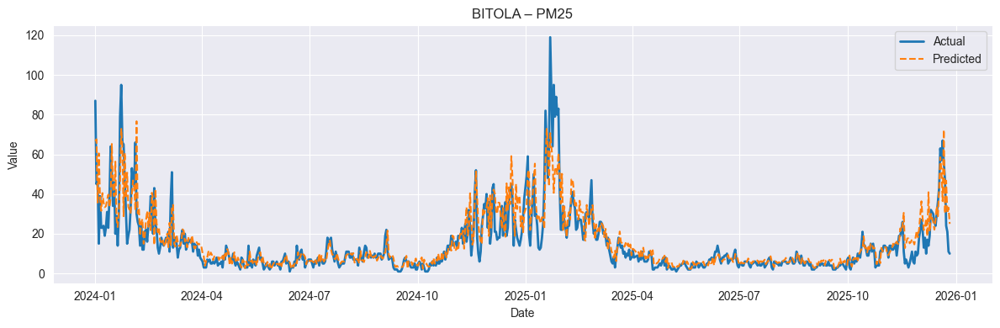

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

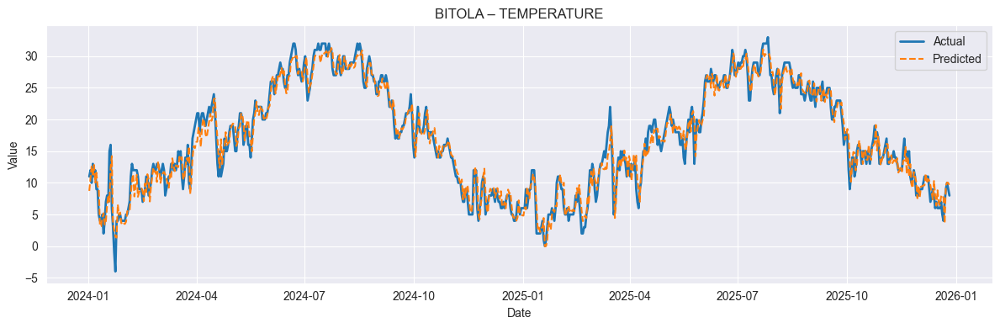

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

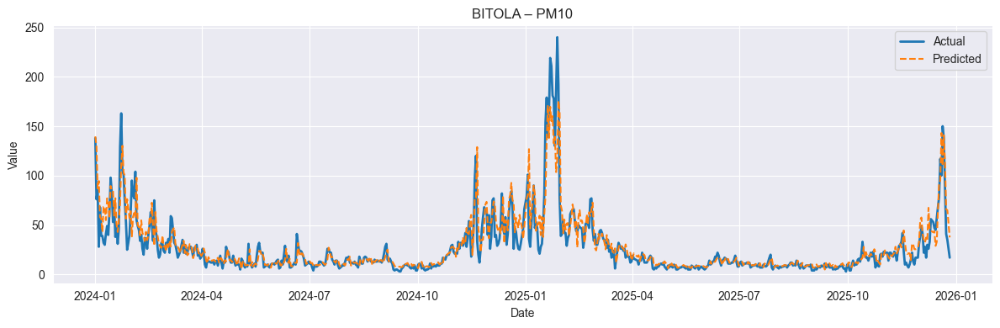

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

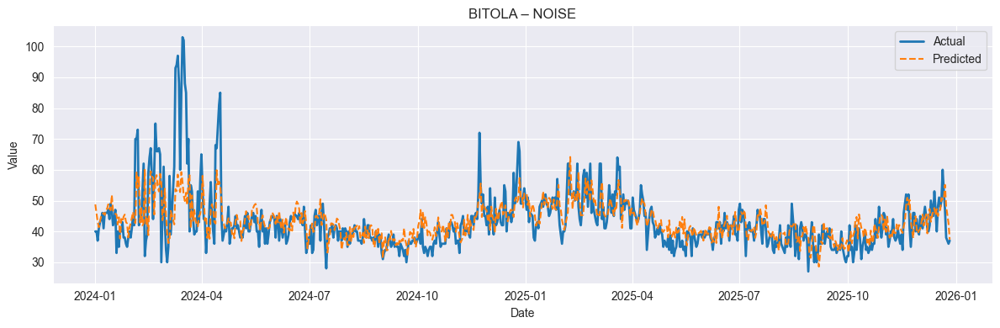

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

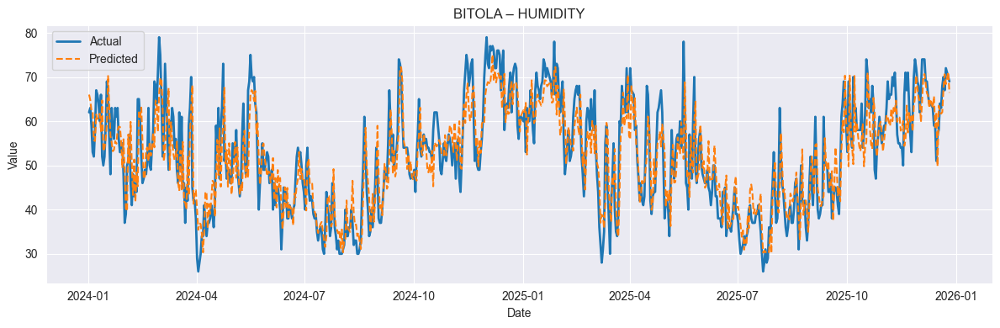

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

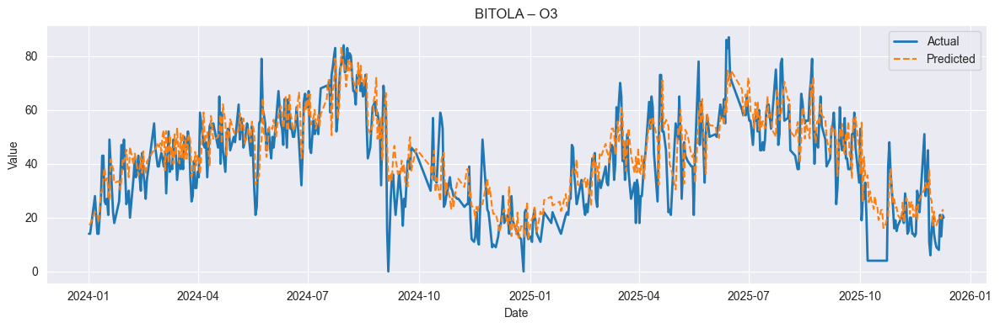

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

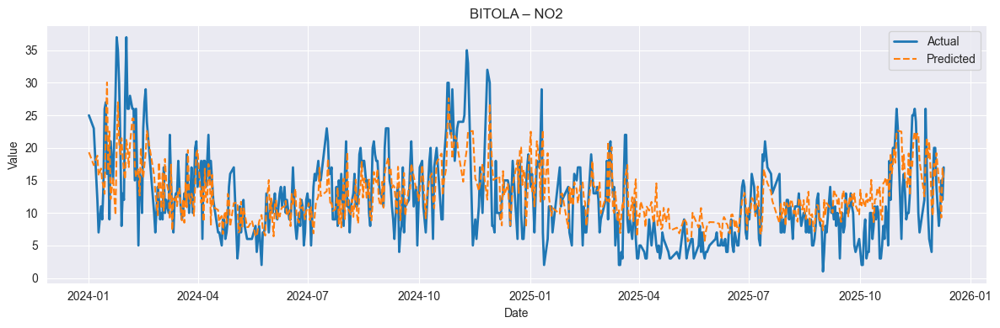

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

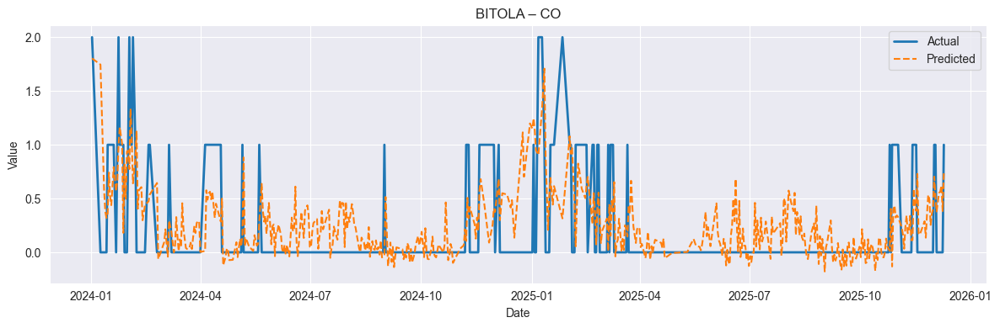

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

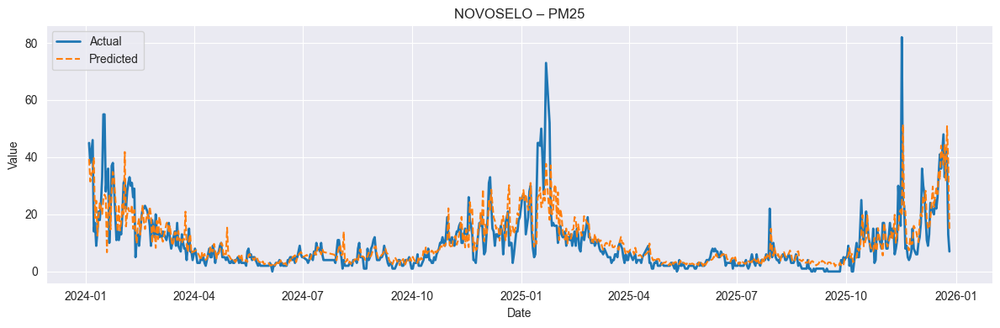

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

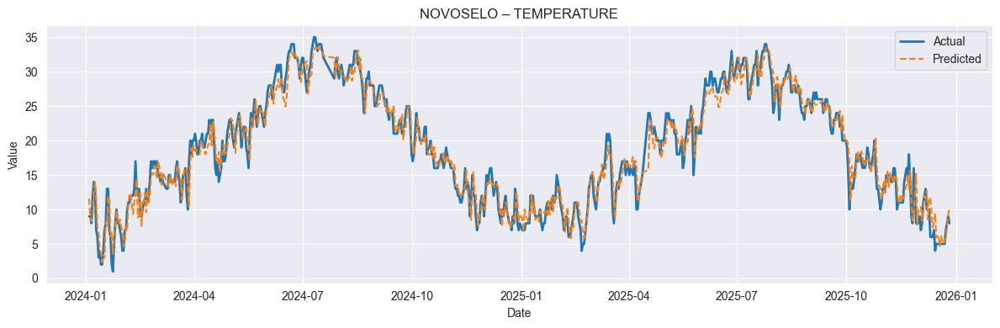

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

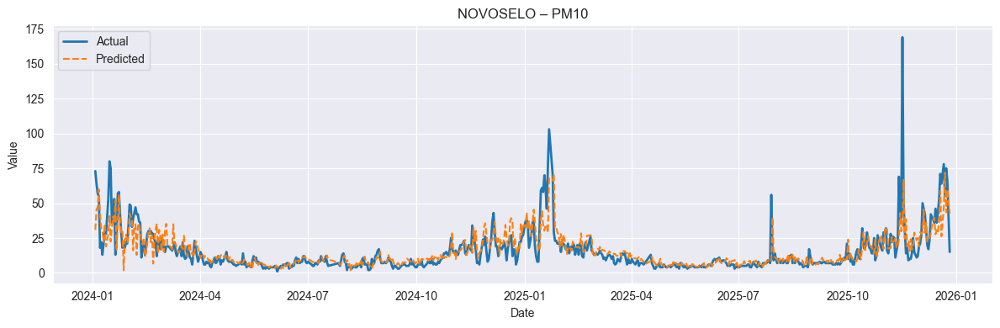

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

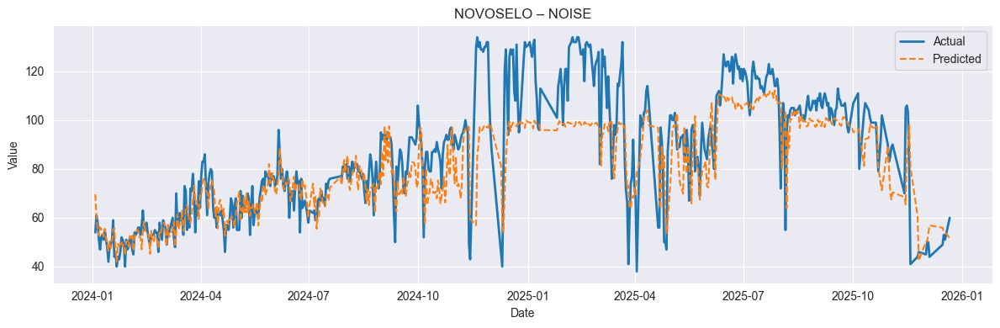

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

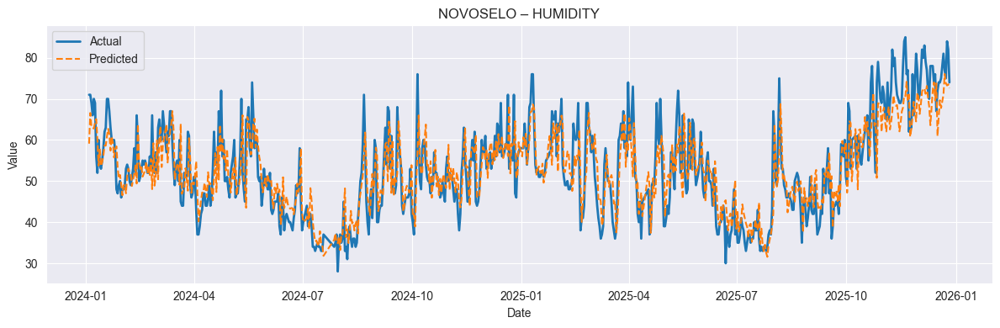

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

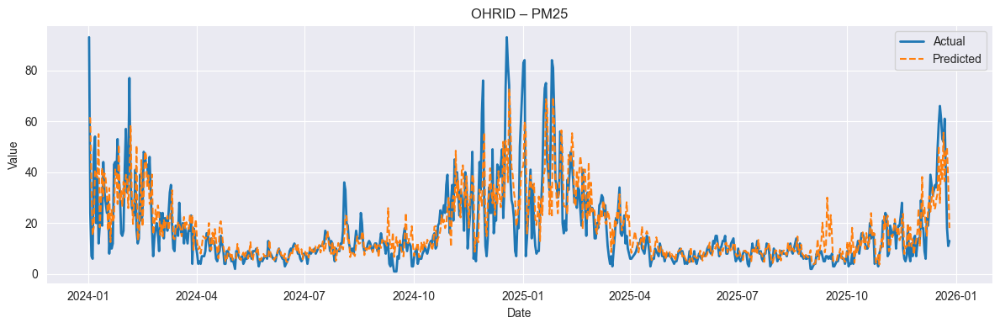

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

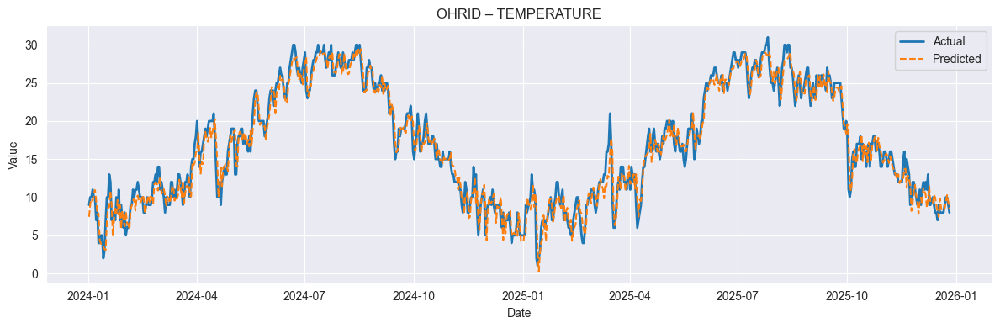

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

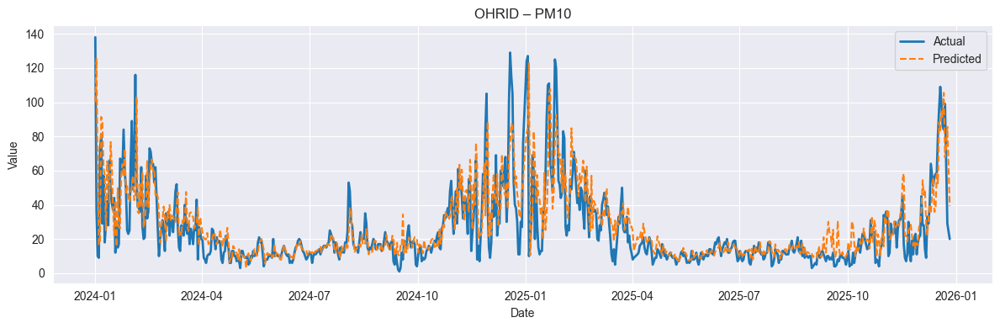

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

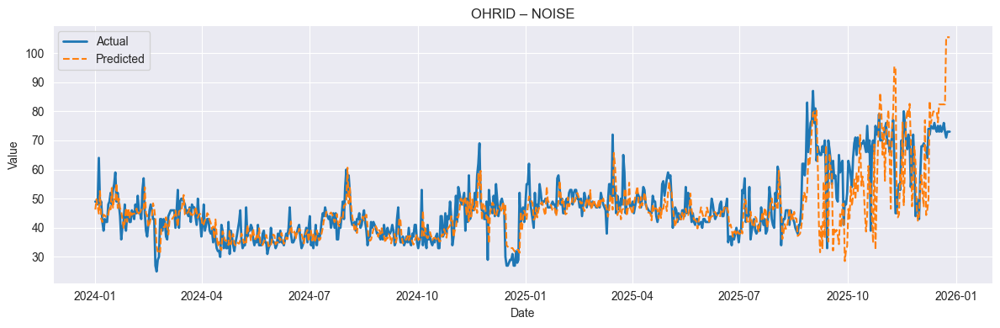

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

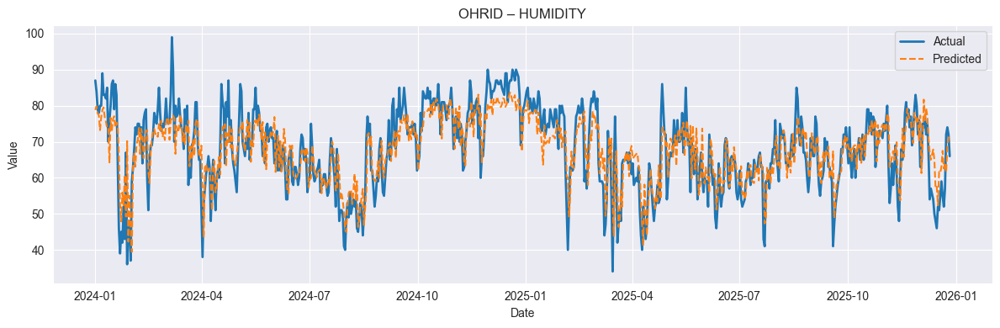

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

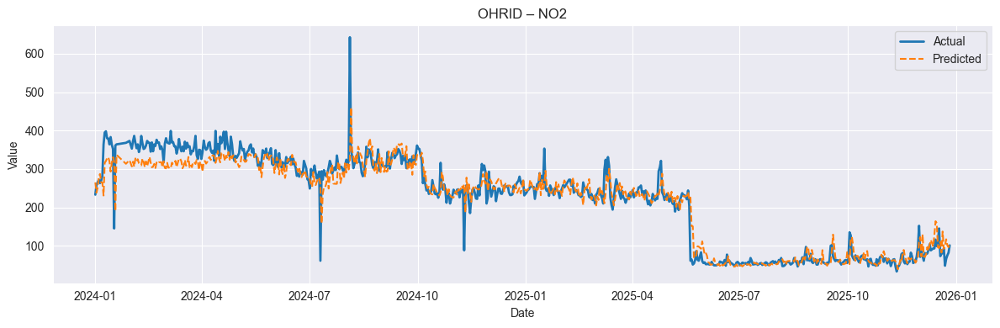

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

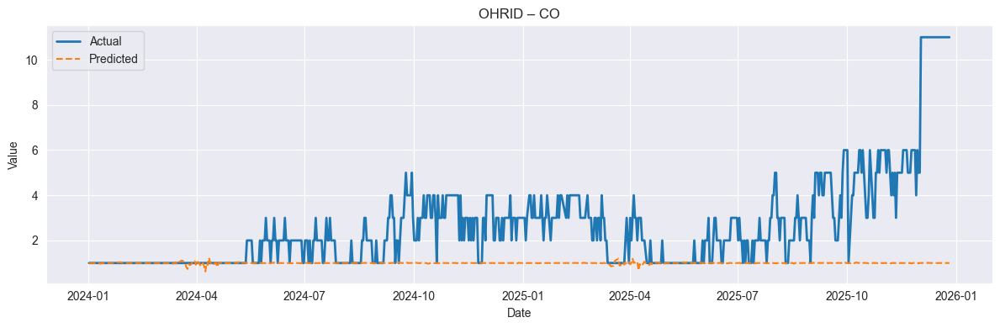

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

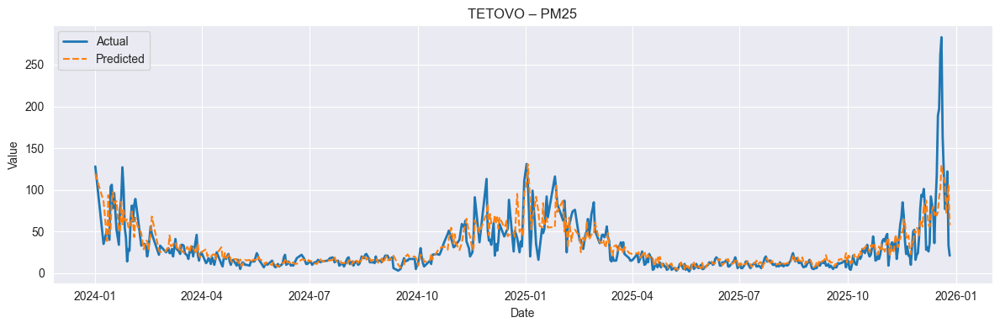

Skipping tetovo-temperature: insufficient data


/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

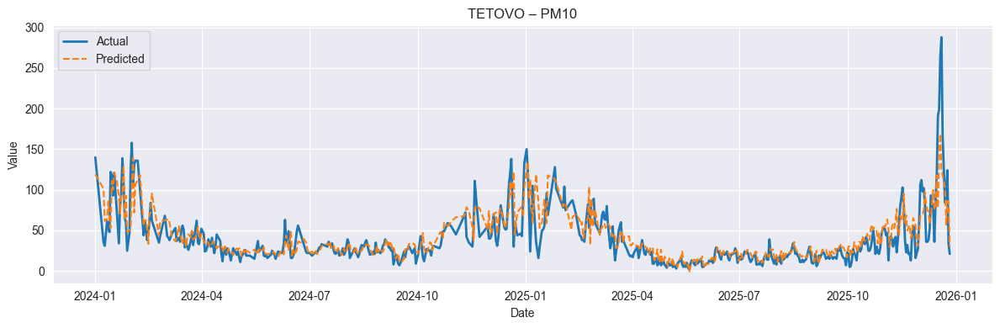

Skipping tetovo-noise: insufficient data
Skipping tetovo-humidity: insufficient data


/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

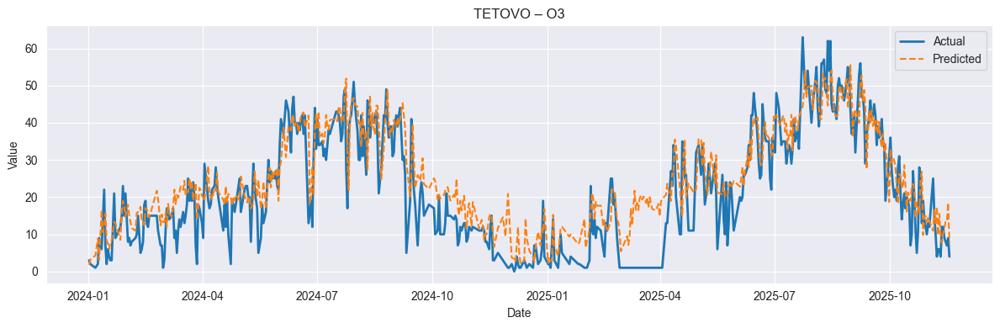

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

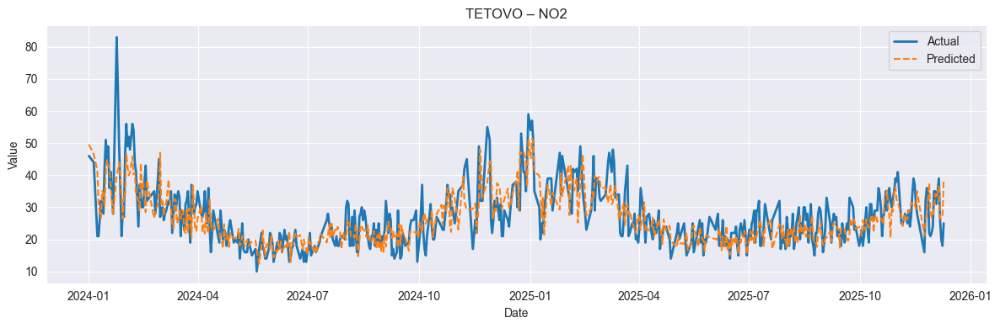

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

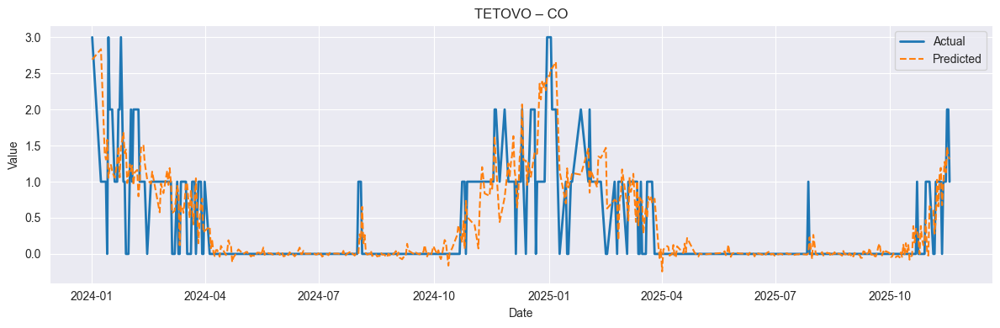

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

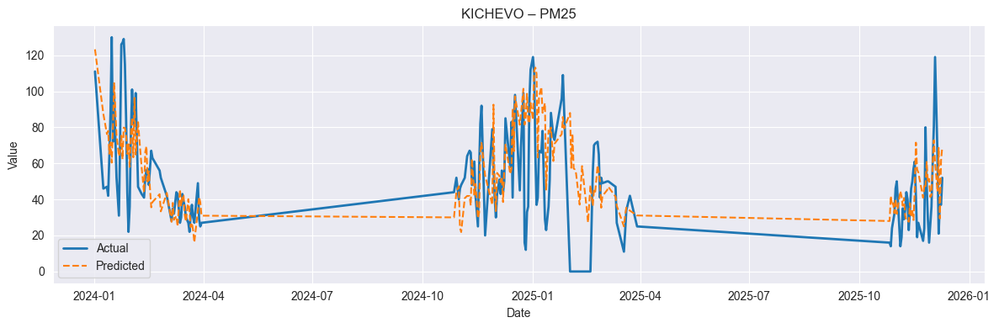

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

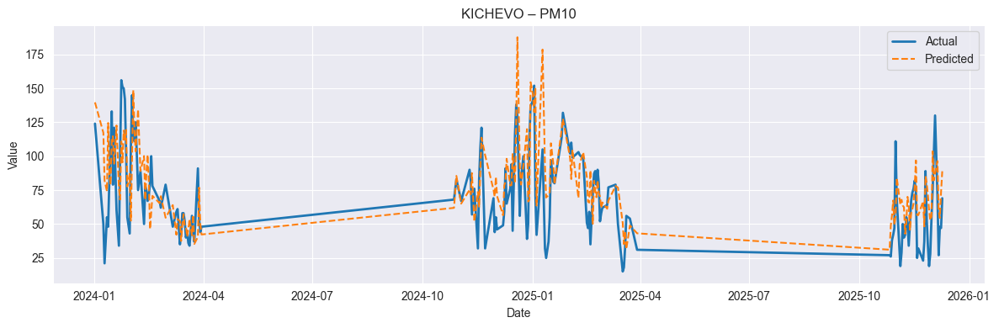

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

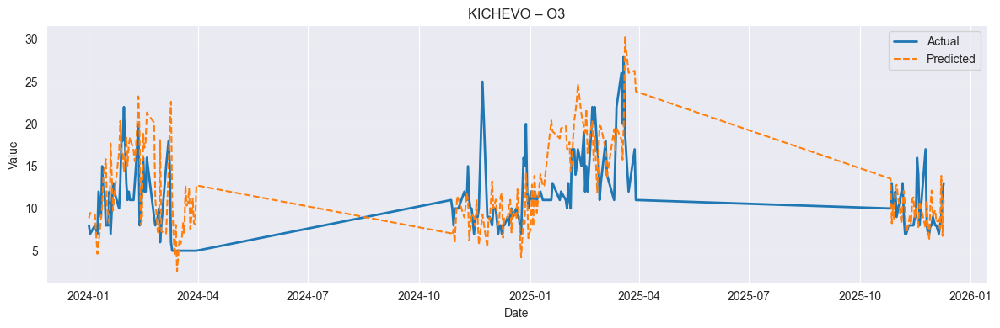

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

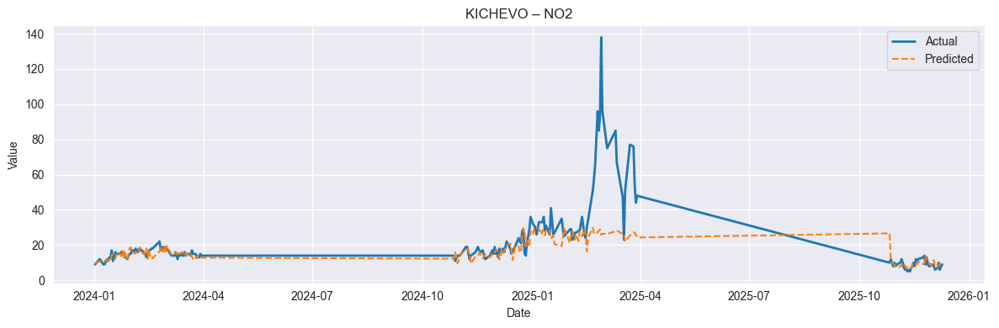

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

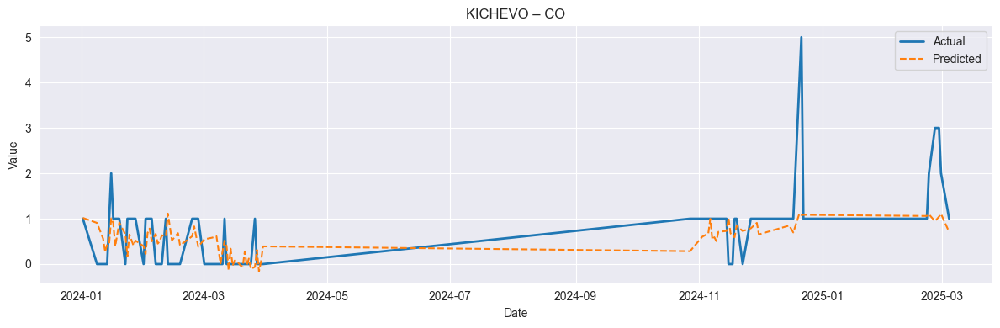

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

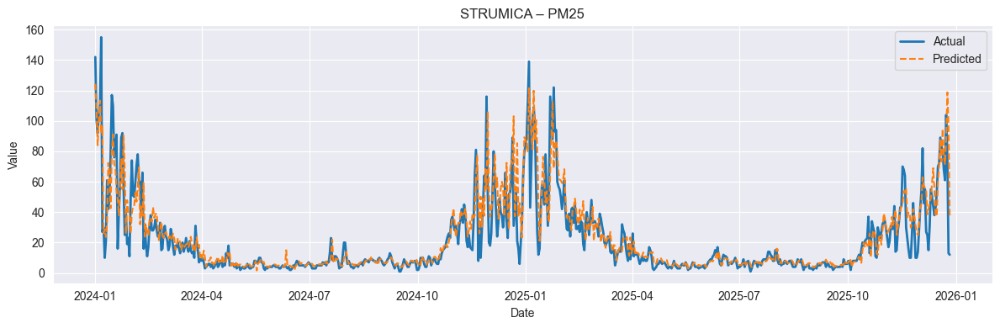

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

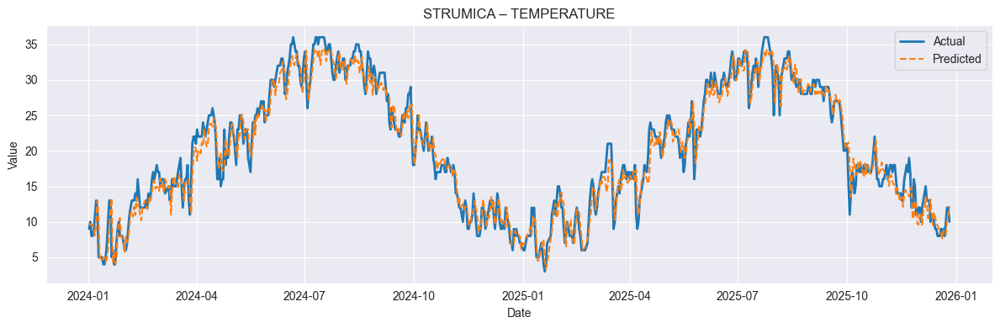

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

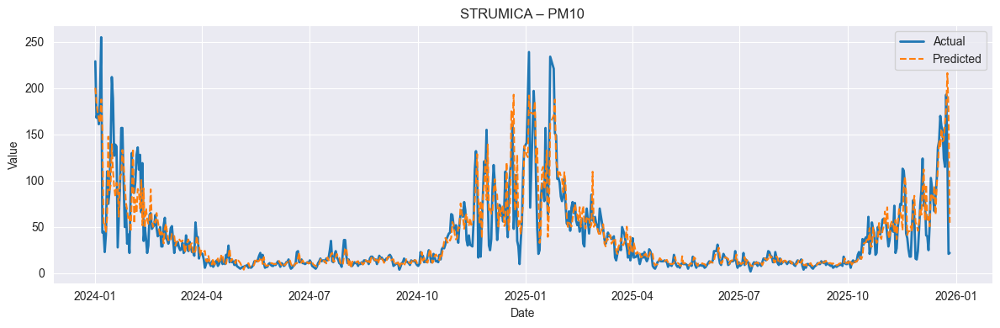

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

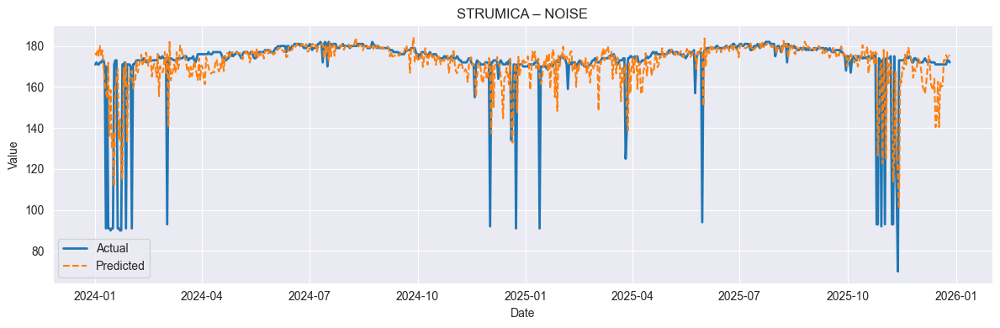

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

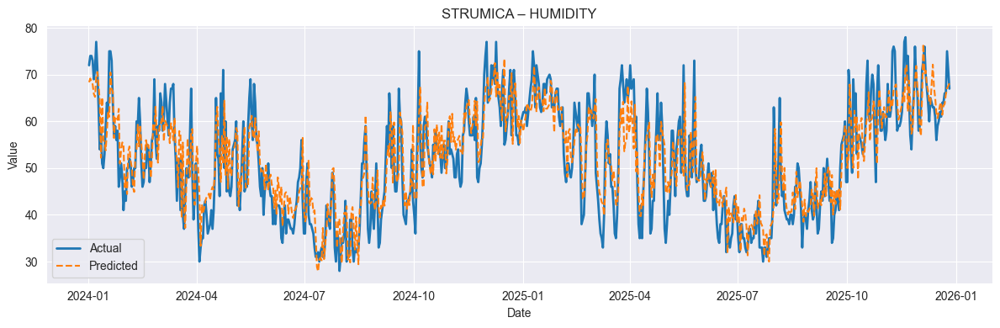

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

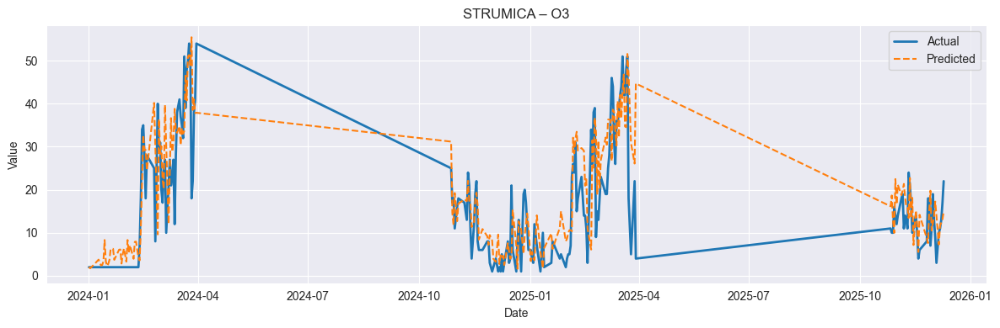

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

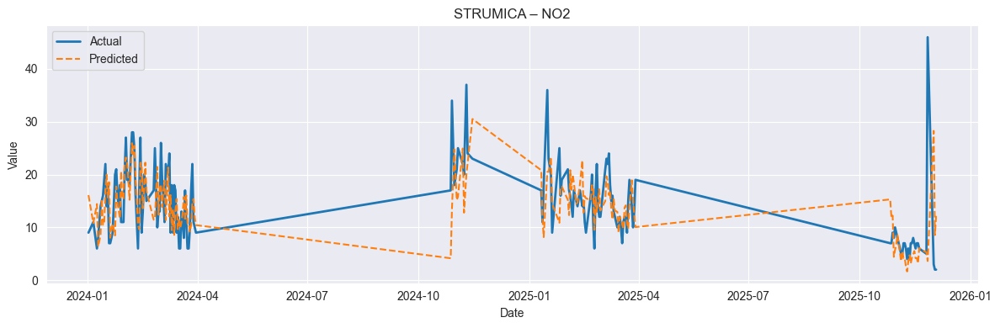

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

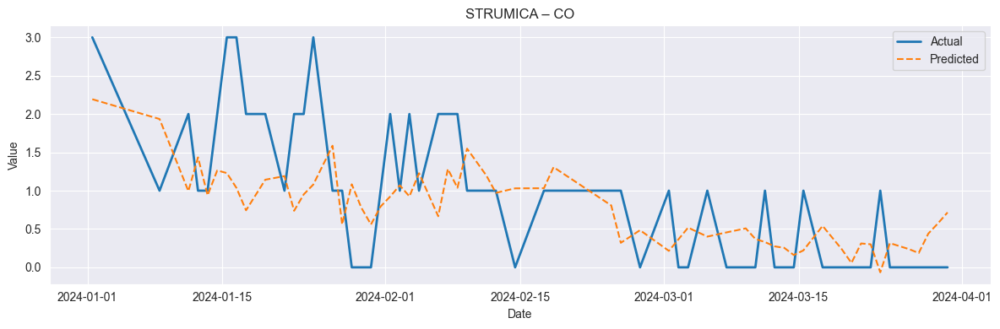

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

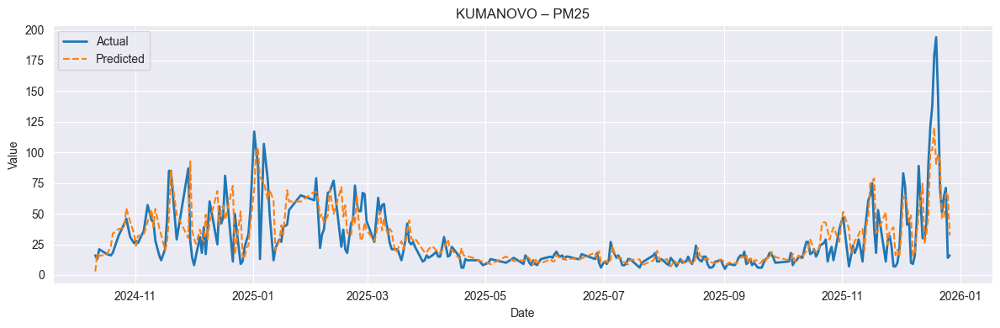

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

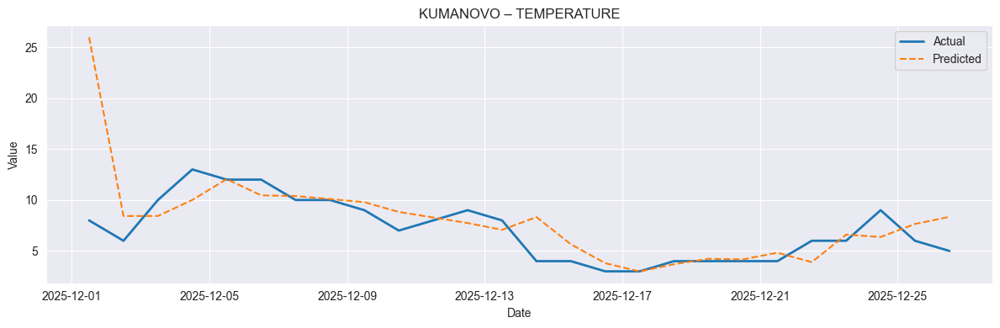

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

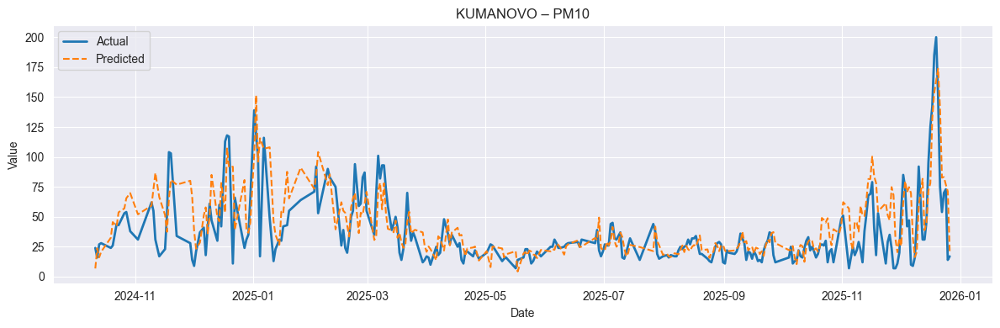

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

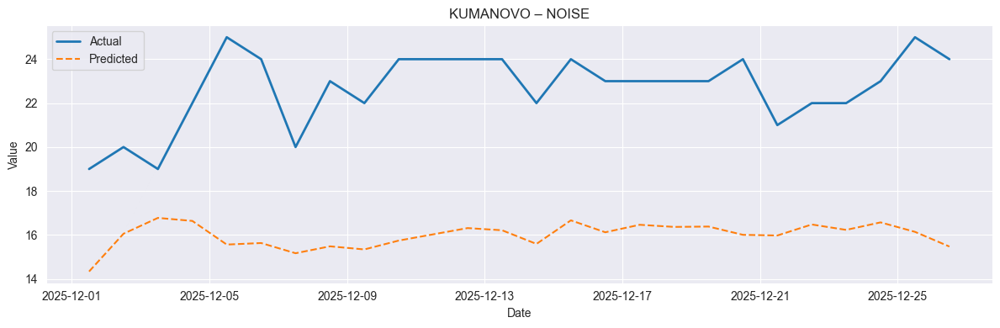

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

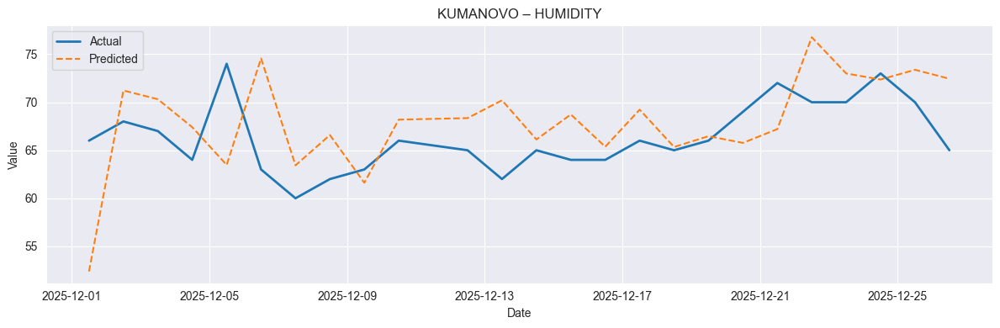

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

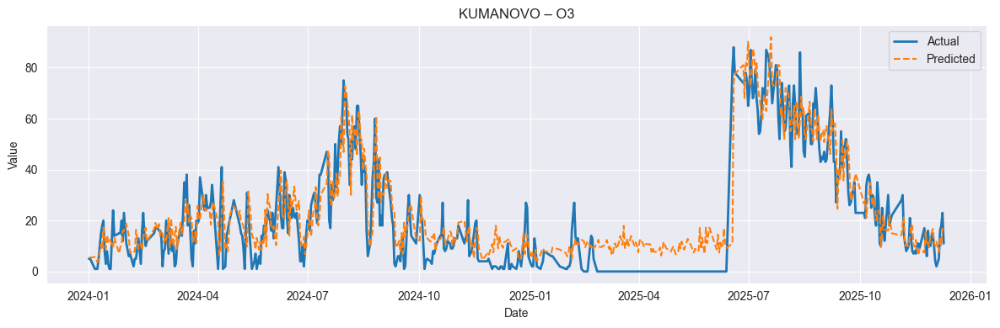

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

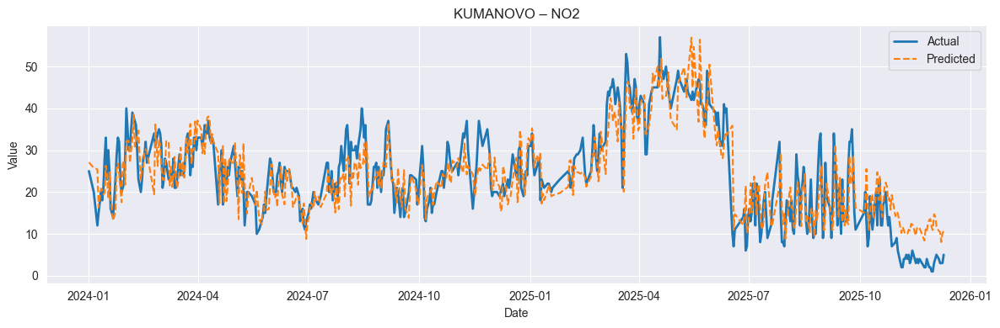

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

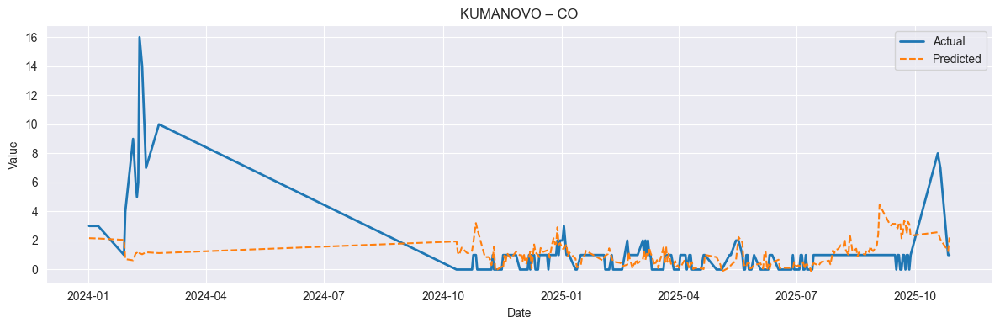

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

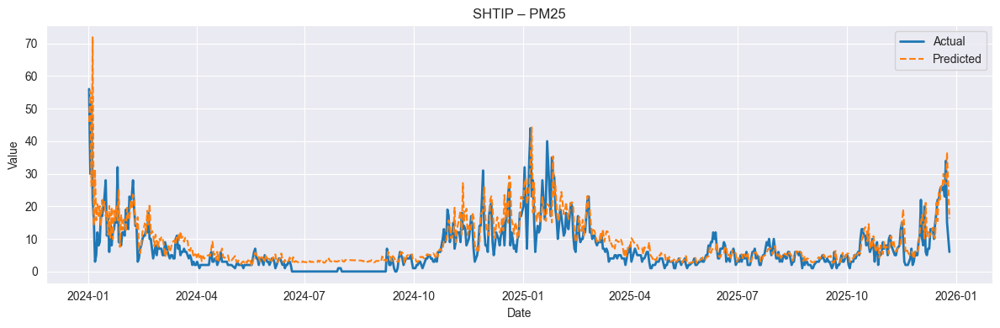

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

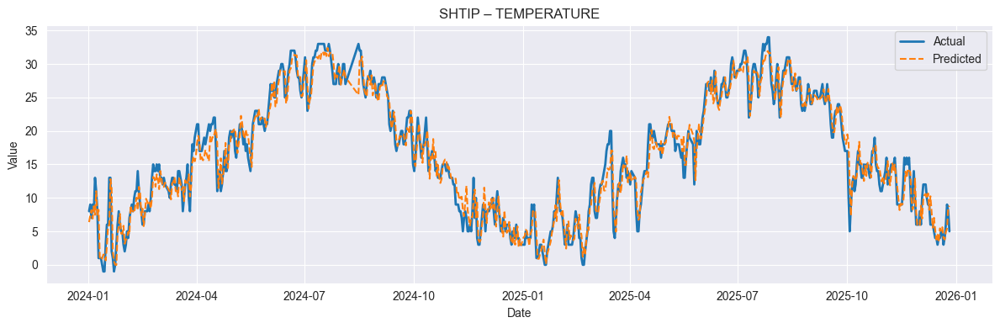

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

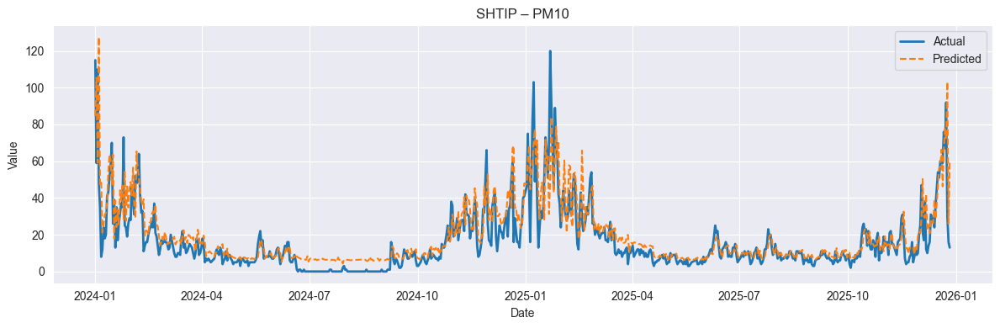

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

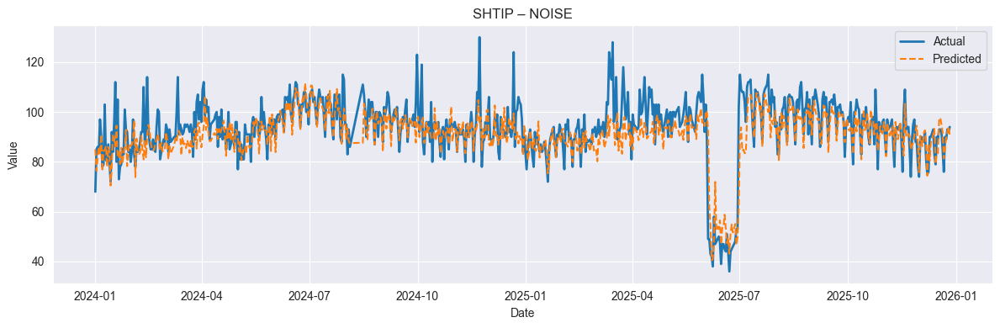

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

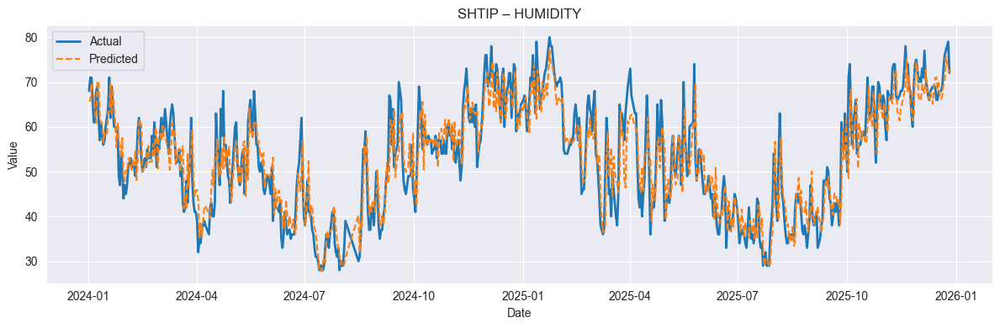

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

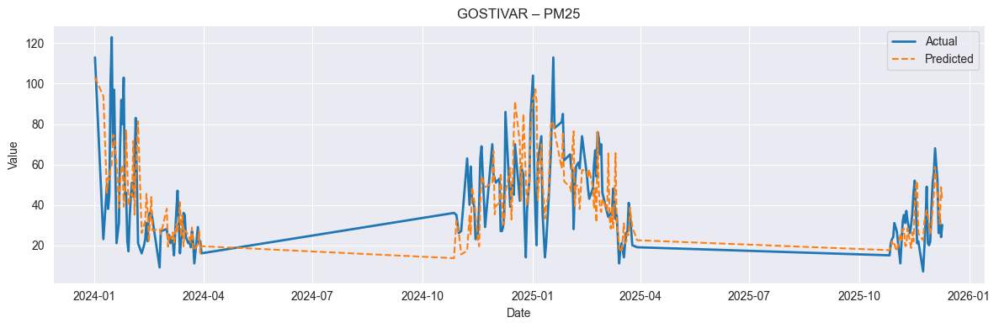

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

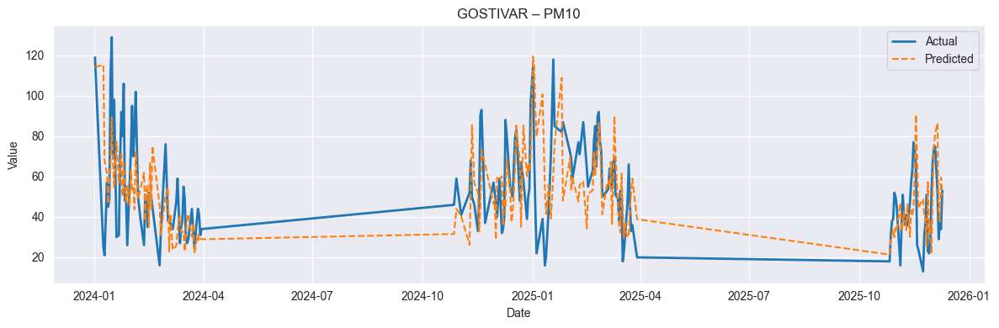

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

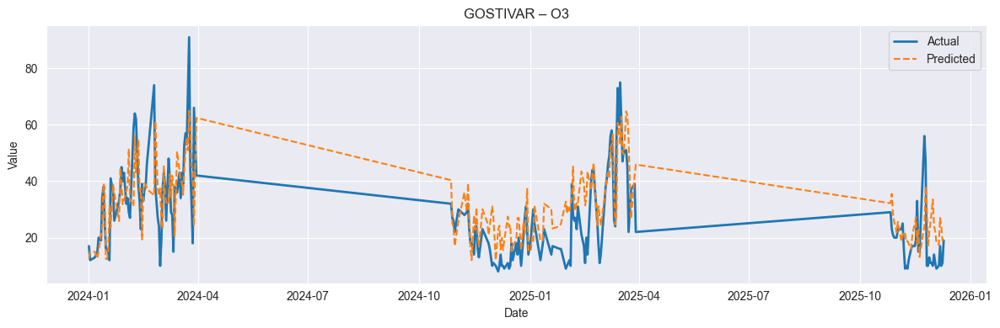

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

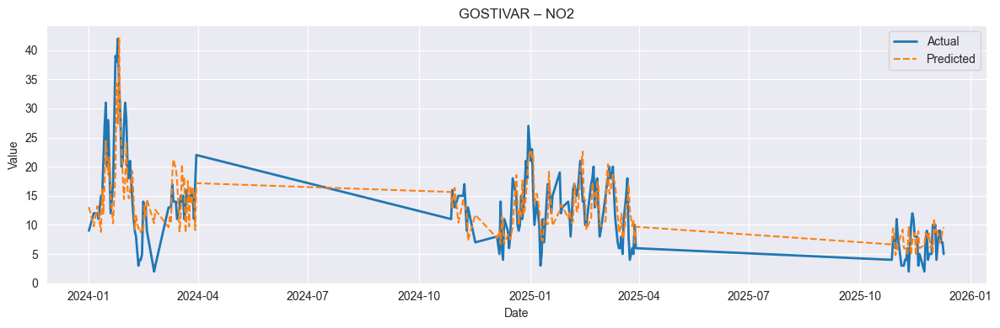

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

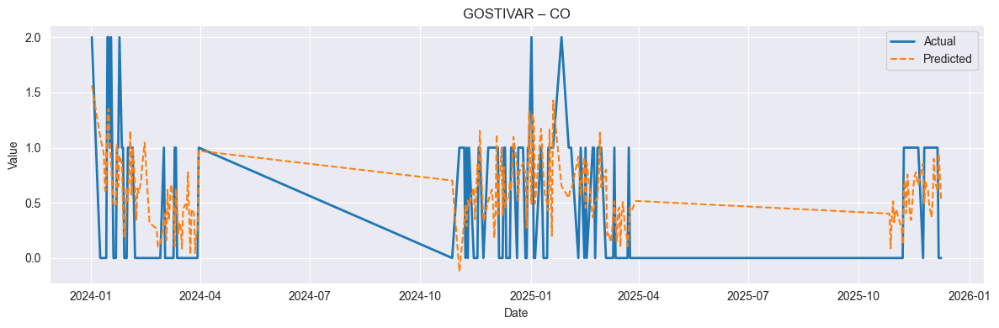

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Skipping bogdanci-pm25: insufficient data
Skipping bogdanci-temperature: insufficient data
Skipping bogdanci-pm10: insufficient data
Skipping bogdanci-noise: insufficient data
Skipping bogdanci-humidity: insufficient data


/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

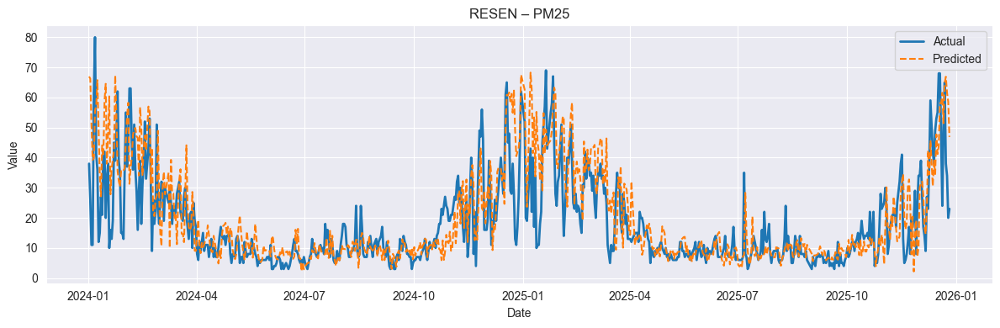

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

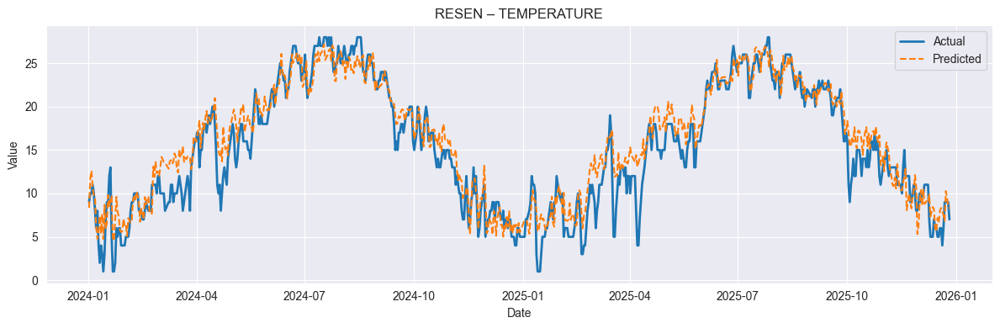

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

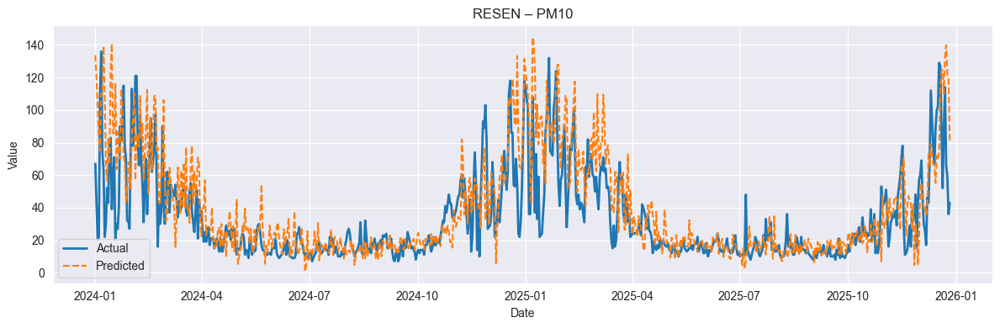

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

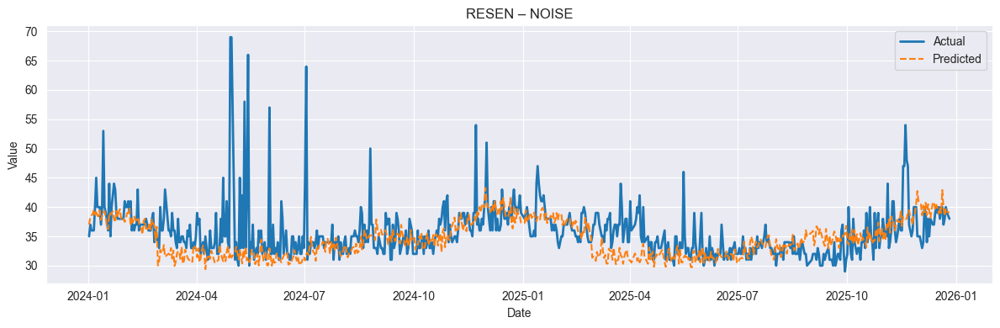

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

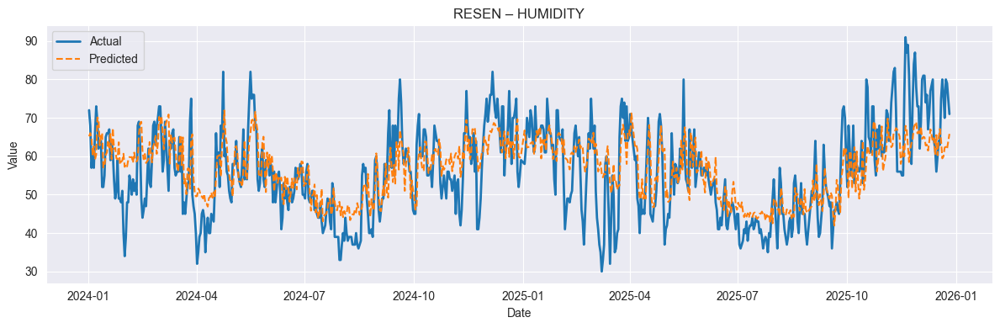

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

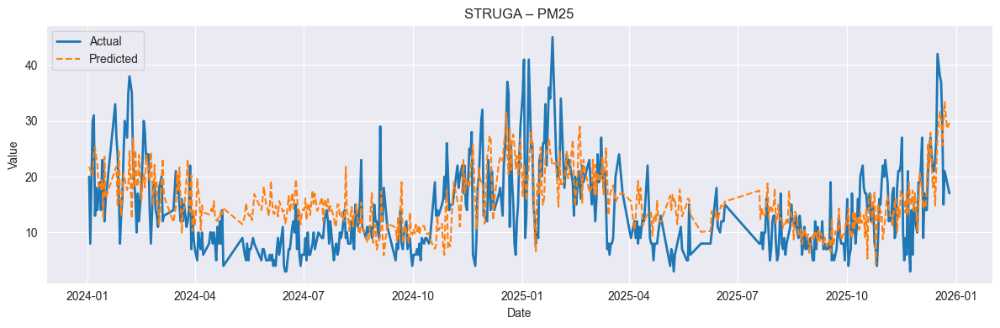

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

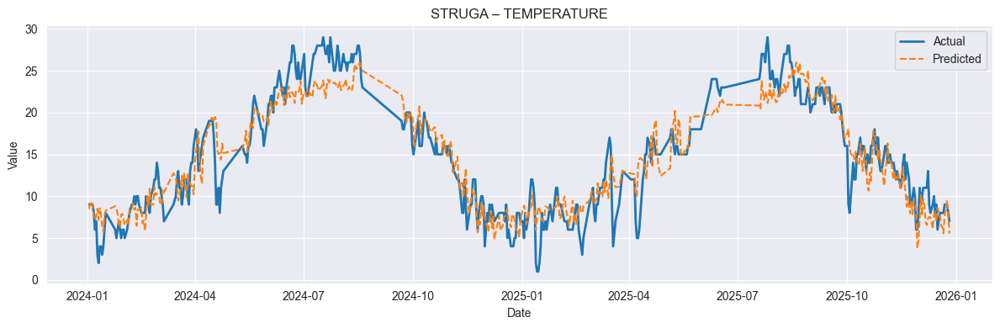

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

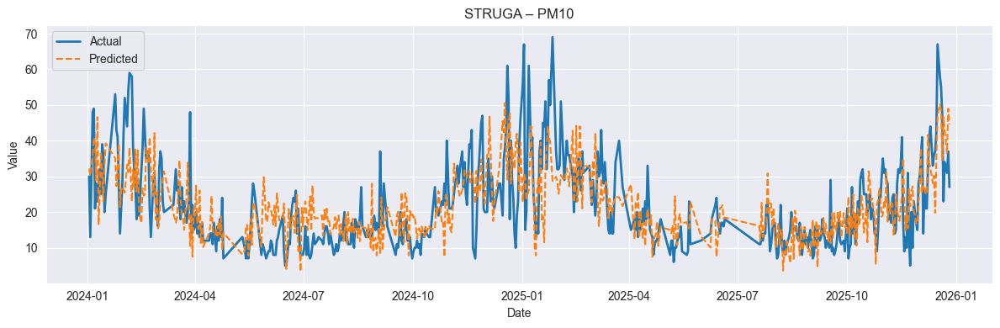

/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Skipping struga-noise: insufficient data


/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
 

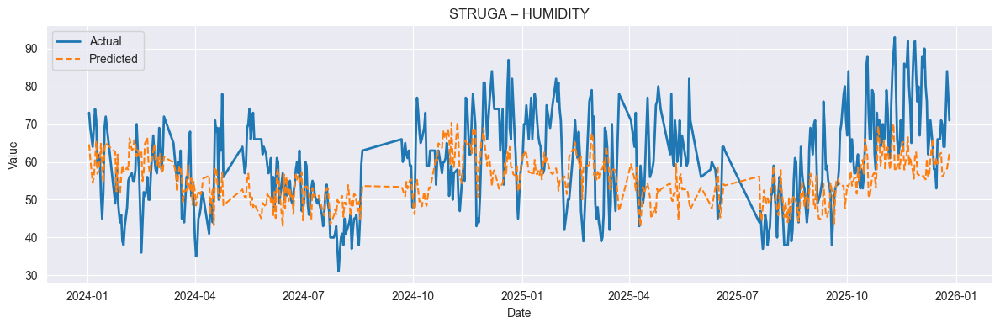

Skipping stardojran-pm25: insufficient data
Skipping stardojran-temperature: insufficient data
Skipping stardojran-pm10: insufficient data
Skipping stardojran-humidity: insufficient data
Skipping radovis-pm25: insufficient data
Skipping radovis-temperature: insufficient data
Skipping radovis-pm10: insufficient data
Skipping radovis-noise: insufficient data
Skipping radovis-humidity: insufficient data
Skipping veles-pm25: insufficient data
Skipping veles-temperature: insufficient data
Skipping veles-pm10: insufficient data
Skipping veles-humidity: insufficient data
Skipping krusevo-pm25: insufficient data
Skipping krusevo-temperature: insufficient data
Skipping krusevo-pm10: insufficient data
Skipping krusevo-noise: insufficient data
Skipping krusevo-humidity: insufficient data
Skipping kocani-pm25: insufficient data
Skipping kocani-temperature: insufficient data
Skipping kocani-pm10: insufficient data
Skipping kocani-noise: insufficient data
Skipping kocani-humidity: insufficient data


In [11]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
import joblib
import matplotlib.pyplot as plt
import os
import numpy as np

results = {}

MIN_TRAIN_SAMPLES = 50
MIN_TEST_SAMPLES = 10

for city in df['city'].unique():
    for indicator in df['type'].unique():

        df_ci = df[(df['city'] == city) & (df['type'] == indicator)].copy()
        if df_ci.empty:
            continue

        train = df_ci[df_ci['timestamp'] < '2024-01-01']
        test  = df_ci[df_ci['timestamp'] >= '2024-01-01']

        if len(train) < MIN_TRAIN_SAMPLES or len(test) < MIN_TEST_SAMPLES:
            print(f"Skipping {city}-{indicator}: insufficient data")
            continue

        X_train = train[cat_features + num_features]
        y_train = train['value']
        X_test  = test[cat_features + num_features]
        y_test  = test['value']

        preprocess = ColumnTransformer(
            transformers=[
                ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features),
                ('num', 'passthrough', num_features)
            ]
        )

        model = LGBMRegressor(
            random_state=42,
            min_child_samples=20,
            verbosity=-1
        )

        pipe = Pipeline([
            ('prep', preprocess),
            ('model', model)
        ])

        param_grid = {
            'model__n_estimators': [300, 600],
            'model__num_leaves': [31, 63],
            'model__learning_rate': [0.05, 0.03],
        }

        max_splits = min(5, len(X_train) // 20)
        if max_splits < 2:
            print(f"Skipping {city}-{indicator}: not enough samples for CV")
            continue

        tscv = TimeSeriesSplit(n_splits=max_splits)

        try:
            grid = GridSearchCV(
                pipe,
                param_grid,
                cv=tscv,
                scoring='neg_mean_absolute_error',
                n_jobs=-1
            )
            grid.fit(X_train, y_train)
        except ValueError as e:
            print(f"GridSearch failed for {city}-{indicator}: {e}")
            continue

        best_model = grid.best_estimator_

        model_path = os.path.join(model_dir, f"{city}_{indicator}.pkl")
        joblib.dump(best_model, model_path)

        preds = best_model.predict(X_test)

        results[(city, indicator)] = {
            'model': best_model,
            'y_test': y_test,
            'y_pred': preds
        }

        plt.figure(figsize=(12, 4))
        plt.plot(test['timestamp'], y_test.values, label='Actual', linewidth=2)
        plt.plot(test['timestamp'], preds, label='Predicted', linestyle='--')
        plt.title(f'{city.upper()} – {indicator.upper()}')
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()


/var/folders/1r/8qsv6l4d2xs9tv69xpg5sfqw0000gn/T/ipykernel_1446/2449212901.py:31: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  future_df.fillna(method='ffill', inplace=True)
/Users/miloshkirovski/PycharmProjects/environmental_analytics_project/.venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


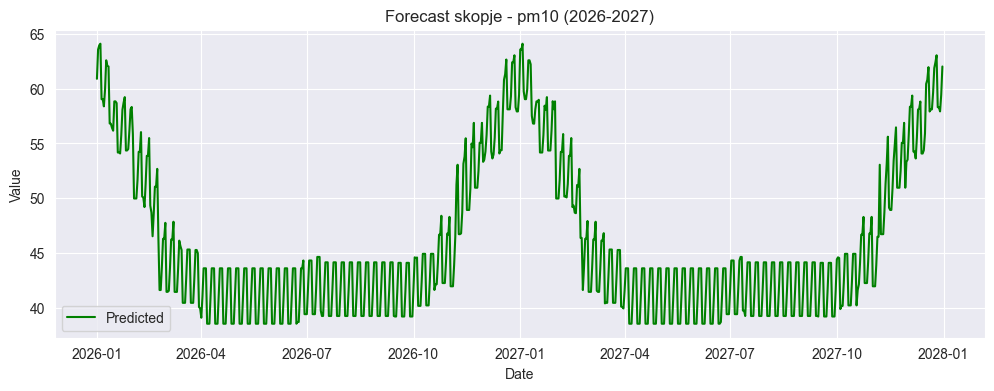

,timestamp,predicted
0,2026-01-01,60.910817
1,2026-01-02,63.589516
2,2026-01-03,63.971502
3,2026-01-04,64.117541
4,2026-01-05,59.049385
5,2026-01-06,59.049385
6,2026-01-07,58.393723
7,2026-01-08,59.923254
8,2026-01-09,62.601952
9,2026-01-10,62.090432


In [20]:
def predict_future(city, indicator, start_year=2026, end_year=2027):
    model_path = os.path.join(model_dir, f"{city}_{indicator}.pkl")
    model = joblib.load(model_path)

    future_dates = pd.date_range(
        start=f'{start_year}-01-01',
        end=f'{end_year}-12-31',
        freq='D'
    )
    future_df = pd.DataFrame({
        'timestamp': future_dates,
        'city': city,
        'type': indicator
    })

    future_df['dayofyear'] = future_df['timestamp'].dt.dayofyear
    future_df['dayofweek'] = future_df['timestamp'].dt.dayofweek
    future_df['month'] = future_df['timestamp'].dt.month
    future_df['year'] = future_df['timestamp'].dt.year
    future_df['sin_doy'] = np.sin(2 * np.pi * future_df['dayofyear'] / 365)
    future_df['cos_doy'] = np.cos(2 * np.pi * future_df['dayofyear'] / 365)

    last_values = df[(df['city'] == city) & (df['type'] == indicator)].sort_values('timestamp')['value'].values
    for lag in LAGS:
        future_df[f'lag_{lag}'] = np.nan
        future_df.loc[0, f'lag_{lag}'] = last_values[-lag]
    for w in WINDOWS:
        future_df[f'roll_mean_{w}'] = np.nan
        future_df.loc[0, f'roll_mean_{w}'] = np.mean(last_values[-w:])

    future_df.fillna(method='ffill', inplace=True)

    X_future = future_df[cat_features + num_features]
    future_df['predicted'] = model.predict(X_future)

    plt.figure(figsize=(12, 4))
    plt.plot(future_df['timestamp'], future_df['predicted'], label='Predicted', color='green')
    plt.title(f'Forecast {city} - {indicator} ({start_year}-{end_year})')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.grid(True)
    plt.legend()
    plt.show()

    return future_df[['timestamp', 'predicted']]


future_preds = predict_future('skopje', 'pm10', 2026, 2027)
future_preds.head(10)